<a href="https://colab.research.google.com/github/Leonardorochagit/Geracao_Energia/blob/main/pycaret_3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Time Séries - Geração de Energia no Amazonas de 2018 a 2021**
                    
**Leonardo Rocha Abril/2022**

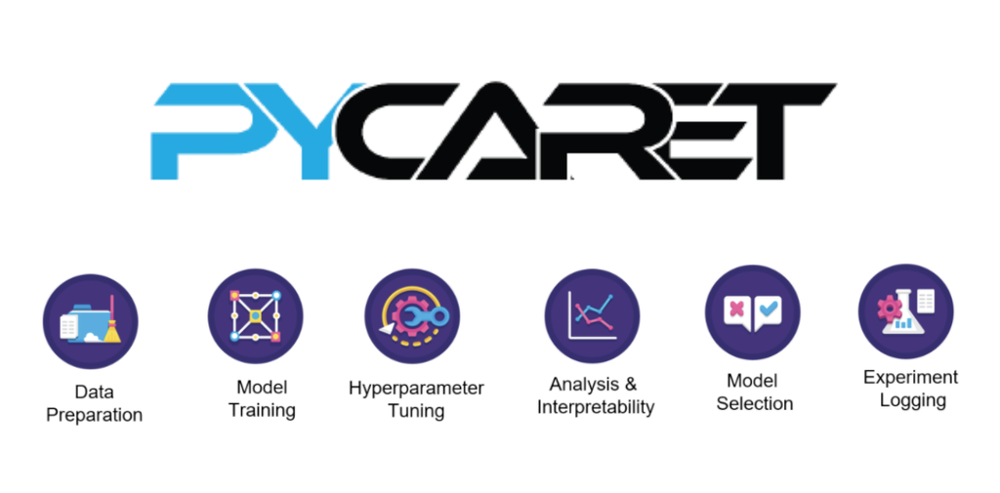

### **📢 Announcing PyCaret’s New Time Series Module**

https://towardsdatascience.com/announcing-pycarets-new-time-series-module-b6e724d4636c

Moez Ali

Data Scientist, Founder & Author of PyCaret

In [1]:
# !pip install cmdstanpy==0.9.5

In [2]:
# # # !pip install pystan==2.19.1.1
# !pip install pycaret-ts-alpha

In [3]:
# ! pip install prophet[full]

In [4]:
# ! pip install prophet

In [5]:
from pycaret.utils import enable_colab
enable_colab()

Colab mode enabled.


In [6]:
from pycaret.time_series import *

In [7]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Wed Apr 27 02:37:42 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   41C    P8    10W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [8]:
# -*- coding: utf-8 -*-
import numpy as np
import pandas as pd
from pandas import Grouper 
from pandas import DataFrame
from datetime import datetime

#ARIMA

#from pmdarima.arima import auto_arima
#Stats Models 
from statsmodels.tsa.filters.hp_filter import hpfilter
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf, month_plot, quarter_plot

#Graficos 
import matplotlib.pyplot as plt
import matplotlib as mpl
import plotly.express as px


from matplotlib import pyplot
import seaborn as sns 
import warnings

warnings.filterwarnings("ignore")
import warnings; warnings.filterwarnings(action='once')

#plt.rcParams["figure.figsize"] = (15,15)
large = 22; med = 16; small = 12
params = {'axes.titlesize': large, 'legend.fontsize': med,'figure.figsize': (16, 10),'axes.labelsize': med,
          'axes.titlesize': med, 'xtick.labelsize': med, 'ytick.labelsize': med,'figure.titlesize': large}
plt.rcParams.update(params)
plt.style.use('seaborn-whitegrid')
sns.set_style("white")
plt.style.use('seaborn')
sns.set()
%matplotlib inline 

In [9]:
# !pip install pycaret[full]

In [10]:
# try:
#     from pycaret import show_versions
# except ModuleNotFoundError:
#     !pip install pycaret-ts-alpha

# from pycaret import show_versions
# show_versions()

In [11]:
# !pip install prophet

In [12]:
# !pip install fbprophet

In [13]:
# !pip install scikit-learn==1.0.0

https://github.com/pycaret/pycaret/blob/time_series/examples/TimeSeries_Forecasting.ipynb

https://towardsdatascience.com/announcing-pycarets-new-time-series-module-b6e724d4636c

###**📊 Loading Data**


In [14]:
import pandas as pd

In [15]:
# lendo o dataset e criando um dataframe de series temporais 
df = pd.read_csv('https://raw.githubusercontent.com/Leonardorochagit/Geracao_Energia/main/Base_ONS/dataset_processado.csv',  delimiter=',', header=0, 
                squeeze=True, parse_dates=True, index_col=0, encoding = 'utf-8',engine='c') #  index_col=3
df.head()  

,geracao,media,variancia
Data Dica,,,
2018-01-01,18.118144,NaN,NaN
2018-01-02,17.801709,18.118144,0.000000
2018-01-03,17.267649,17.959927,0.025033
2018-01-04,17.303115,17.729167,0.123188
2018-01-05,17.672623,17.622654,0.126426


In [16]:
df2= df.rename(columns={'Data Dica':'data'})
df2

,geracao,media,variancia
Data Dica,,,
2018-01-01,18.118144,NaN,NaN
2018-01-02,17.801709,18.118144,0.000000
2018-01-03,17.267649,17.959927,0.025033
2018-01-04,17.303115,17.729167,0.123188
2018-01-05,17.672623,17.622654,0.126426
...,...,...,...
2021-12-27,21.742712,23.137358,17.889572
2021-12-28,17.418880,23.136401,17.878628
2021-12-29,16.949582,23.132479,17.888771


In [17]:
# df2.data = pd.to_datetime(df2.data ) #, format="%d/%m/%Y"
# df2

In [18]:
# del df["Unnamed: 0"]

In [19]:
# df.set_index("data", inplace=True)

In [20]:
fig = px.line(df2, x=df2.index, y=df2.geracao) 
fig.update_layout(autosize=True,width=1000, height=600)
#fig.write_image("grafico.png") 
#fig.write_html("grafico.html")
fig.show()

**PyCaret**

In [21]:
data=df2.copy()
data

,geracao,media,variancia
Data Dica,,,
2018-01-01,18.118144,NaN,NaN
2018-01-02,17.801709,18.118144,0.000000
2018-01-03,17.267649,17.959927,0.025033
2018-01-04,17.303115,17.729167,0.123188
2018-01-05,17.672623,17.622654,0.126426
...,...,...,...
2021-12-27,21.742712,23.137358,17.889572
2021-12-28,17.418880,23.136401,17.878628
2021-12-29,16.949582,23.132479,17.888771


In [22]:
data['day'] = [i.day for i in data.index]
data['month'] = [i.month for i in data.index]
data['year'] = [i.year for i in data.index]


In [23]:
data

,geracao,media,variancia,day,month,year
Data Dica,,,,,,
2018-01-01,18.118144,NaN,NaN,1,1,2018
2018-01-02,17.801709,18.118144,0.000000,2,1,2018
2018-01-03,17.267649,17.959927,0.025033,3,1,2018
2018-01-04,17.303115,17.729167,0.123188,4,1,2018
2018-01-05,17.672623,17.622654,0.126426,5,1,2018
...,...,...,...,...,...,...
2021-12-27,21.742712,23.137358,17.889572,27,12,2021
2021-12-28,17.418880,23.136401,17.878628,28,12,2021
2021-12-29,16.949582,23.132479,17.888771,29,12,2021


In [24]:
data.drop(['media', 'variancia'], axis=1, inplace=True)
data

,geracao,day,month,year
Data Dica,,,,
2018-01-01,18.118144,1,1,2018
2018-01-02,17.801709,2,1,2018
2018-01-03,17.267649,3,1,2018
2018-01-04,17.303115,4,1,2018
2018-01-05,17.672623,5,1,2018
...,...,...,...,...
2021-12-27,21.742712,27,12,2021
2021-12-28,17.418880,28,12,2021
2021-12-29,16.949582,29,12,2021


In [25]:
df_treino=data[(data.index>='2018-01-01')& (data.index<='2020-12-31')]
df_treino

,geracao,day,month,year
Data Dica,,,,
2018-01-01,18.118144,1,1,2018
2018-01-02,17.801709,2,1,2018
2018-01-03,17.267649,3,1,2018
2018-01-04,17.303115,4,1,2018
2018-01-05,17.672623,5,1,2018
...,...,...,...,...
2020-12-27,22.889017,27,12,2020
2020-12-28,24.492370,28,12,2020
2020-12-29,24.524423,29,12,2020


In [26]:
df_teste=data[(data.index>'2020-12-31')& (data.index<='2021-12-31')]
df_teste

,geracao,day,month,year
Data Dica,,,,
2021-01-01,22.876548,1,1,2021
2021-01-02,24.640270,2,1,2021
2021-01-03,21.461506,3,1,2021
2021-01-04,23.420420,4,1,2021
2021-01-05,24.242198,5,1,2021
...,...,...,...,...
2021-12-27,21.742712,27,12,2021
2021-12-28,17.418880,28,12,2021
2021-12-29,16.949582,29,12,2021


###**⚙️ Inicializar a configuração**

In [27]:
from pycaret.time_series import *

In [28]:
dftest1=df_teste.copy()
dftest=dftest1.reset_index(inplace=True)


In [29]:
dftrain1=df_treino.copy()
#dftrain=dftrain1.reset_index(inplace=True)
dftrain=dftrain1.reset_index()
dftrain.reset_index()

,index,Data Dica,geracao,day,month,year
0,0,2018-01-01,18.118144,1,1,2018
1,1,2018-01-02,17.801709,2,1,2018
2,2,2018-01-03,17.267649,3,1,2018
3,3,2018-01-04,17.303115,4,1,2018
4,4,2018-01-05,17.672623,5,1,2018
...,...,...,...,...,...,...
1091,1091,2020-12-27,22.889017,27,12,2020
1092,1092,2020-12-28,24.492370,28,12,2020
1093,1093,2020-12-29,24.524423,29,12,2020
1094,1094,2020-12-30,23.104828,30,12,2020


In [30]:
# dftrain=df_treino.drop(['media', 'variancia', 'variancia', 'day_of_week',	'day_of_year'], axis=1, inplace=True)# media	variancia	month	year	day_of_week	day_of_year

In [31]:
df_treino

,geracao,day,month,year
Data Dica,,,,
2018-01-01,18.118144,1,1,2018
2018-01-02,17.801709,2,1,2018
2018-01-03,17.267649,3,1,2018
2018-01-04,17.303115,4,1,2018
2018-01-05,17.672623,5,1,2018
...,...,...,...,...
2020-12-27,22.889017,27,12,2020
2020-12-28,24.492370,28,12,2020
2020-12-29,24.524423,29,12,2020


In [32]:
# def setup(
#     data: Union[pd.Series, pd.DataFrame],
#     target: Optional[str] = None,
#     index: Optional[str] = None,
#     ignore_features: Optional[List] = None,
#     preprocess: bool = True,
#     numeric_imputation_target: Optional[Union[int, float, str]] = None,
#     numeric_imputation_exogenous: Optional[Union[int, float, str]] = None,
#     transform_target: Optional[str] = None,
#     transform_exogenous: Optional[str] = None,
#     scale_target: Optional[str] = None,
#     scale_exogenous: Optional[str] = None,
#     fold_strategy: Union[str, Any] = "expanding",
#     fold: int = 3,
#     fh: Optional[Union[List[int], int, np.ndarray, ForecastingHorizon]] = 1,
#     seasonal_period: Optional[Union[List[Union[int, str]], int, str]] = None,
#     enforce_pi: bool = False,
#     enforce_exogenous: bool = True,
#     n_jobs: Optional[int] = -1,
#     use_gpu: bool = False,
#     custom_pipeline: Union[
#         Any, Tuple[str, Any], List[Any], List[Tuple[str, Any]]
#     ] = None,
#     html: bool = True,
#     session_id: Optional[int] = None,
#     system_log: Union[bool, logging.Logger] = True,
#     log_experiment: bool = False,
#     experiment_name: Optional[str] = None,
#     log_plots: Union[bool, list] = False,
#     log_profile: bool = False,
#     log_data: bool = False,
#     verbose: bool = True,
#     profile: bool = False,
#     profile_kwargs: Dict[str, Any] = None,
#     fig_kwargs: Dict[str, Any] = None,
# ):

In [33]:
data

,geracao,day,month,year
Data Dica,,,,
2018-01-01,18.118144,1,1,2018
2018-01-02,17.801709,2,1,2018
2018-01-03,17.267649,3,1,2018
2018-01-04,17.303115,4,1,2018
2018-01-05,17.672623,5,1,2018
...,...,...,...,...
2021-12-27,21.742712,27,12,2021
2021-12-28,17.418880,28,12,2021
2021-12-29,16.949582,29,12,2021


In [34]:
s=setup(df_treino,  target = 'geracao',  ignore_features=['year', 'day',	'month'], fh =100, fold = 1, session_id = 123)

/usr/local/lib/python3.7/dist-packages/pycaret/internal/logging.py:61: ResourceWarning:

unclosed file <_io.TextIOWrapper name='/content/logs.log' mode='a' encoding='UTF-8'>



,Description,Value
0,session_id,123
1,Target,geracao
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Data shape,"(1096, 4)"
5,Train data shape,"(996, 1)"
6,Test data shape,"(100, 1)"
7,Fold Generator,ExpandingWindowSplitter
8,Fold Number,1
9,Enforce Prediction Interval,False


In [35]:
# get metrics
get_metrics()

,Name,Display Name,Score Function,Scorer,Target,Args,Greater is Better,Custom
ID,,,,,,,,
mae,MAE,MAE,<function mean_absolute_error at 0x7f4518dd4ef0>,neg_mean_absolute_error,pred,{},False,False
rmse,RMSE,RMSE,<function mean_squared_error at 0x7f4518dda3b0>,neg_root_mean_squared_error,pred,{'squared': False},False,False
mape,MAPE,MAPE,<function mape at 0x7f4516623cb0>,"make_scorer(mape, greater_is_better=False)",pred,{},False,False
smape,SMAPE,SMAPE,<function _smape_loss at 0x7f4517dc44d0>,"make_scorer(_smape_loss, greater_is_better=False)",pred,{},False,False
mase,MASE,MASE,<function mase at 0x7f4516623a70>,"make_scorer(mase, greater_is_better=False)",pred,{},False,False
rmsse,RMSSE,RMSSE,<function rmsse at 0x7f45166278c0>,"make_scorer(rmsse, greater_is_better=False)",pred,{},False,False
r2,R2,R2,<function r2_score at 0x7f4518dde710>,r2,pred,{},True,False


###**📐Teste Estatístico**

In [36]:
check_stats()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:2019: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.




,Test,Test Name,Data,Property,Setting,Value
0,Summary,Statistics,Actual,Length,,1096.0
1,Summary,Statistics,Actual,Mean,,22.363811
2,Summary,Statistics,Actual,Median,,22.01567
3,Summary,Statistics,Actual,Standard Deviation,,4.271476
4,Summary,Statistics,Actual,Variance,,18.245505
5,Summary,Statistics,Actual,Kurtosis,,-1.213952
6,Summary,Statistics,Actual,Skewness,,0.03402
7,Summary,Statistics,Actual,# Distinct Values,,1096.0
8,White Noise,Ljung-Box,Actual,Test Statictic,"{'alpha': 0.05, 'K': 24}",11392.74999
9,White Noise,Ljung-Box,Actual,Test Statictic,"{'alpha': 0.05, 'K': 48}",18514.013223


##**📈 Análise Exploratória de Dados**

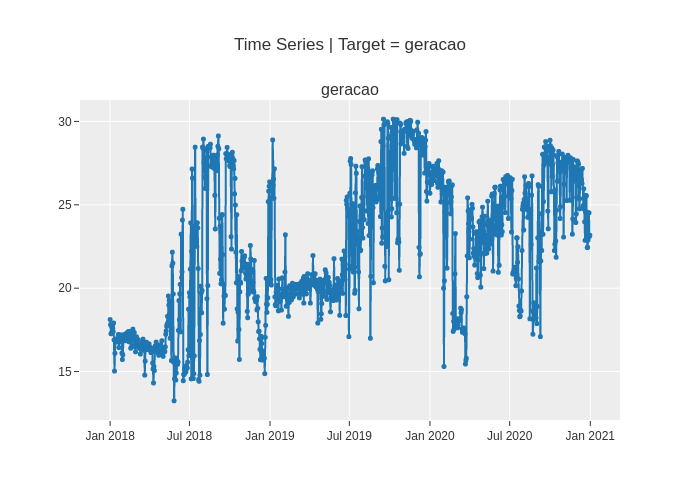

In [37]:
# functional API
plot_model(plot = 'ts')


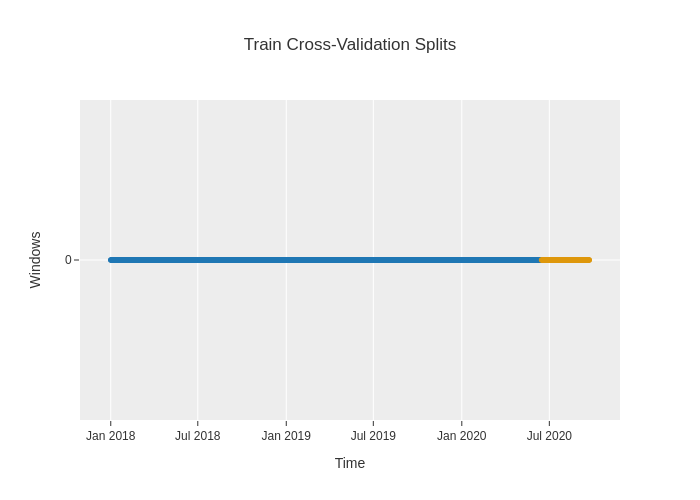

In [38]:
# plot de validação cruzada
plot_model(plot = 'cv')

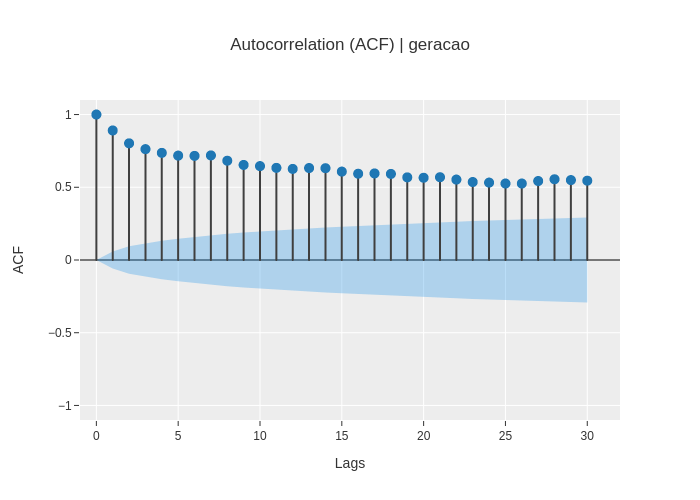

In [39]:
# ACF plot
plot_model(plot = 'acf')

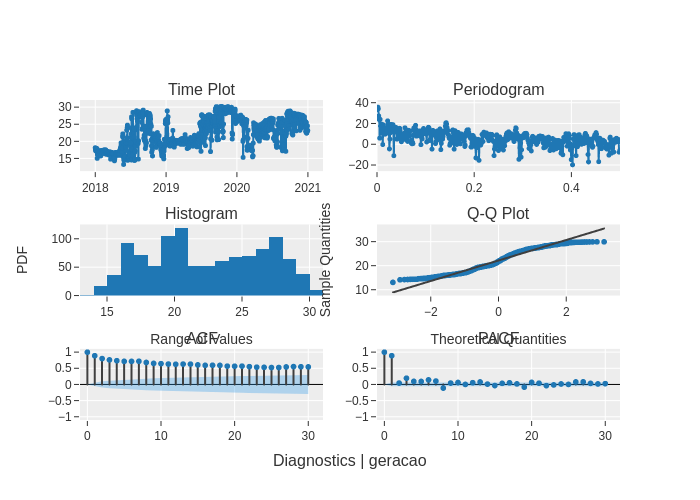

In [40]:
# Diagnostics plot
plot_model(plot = 'diagnostics')

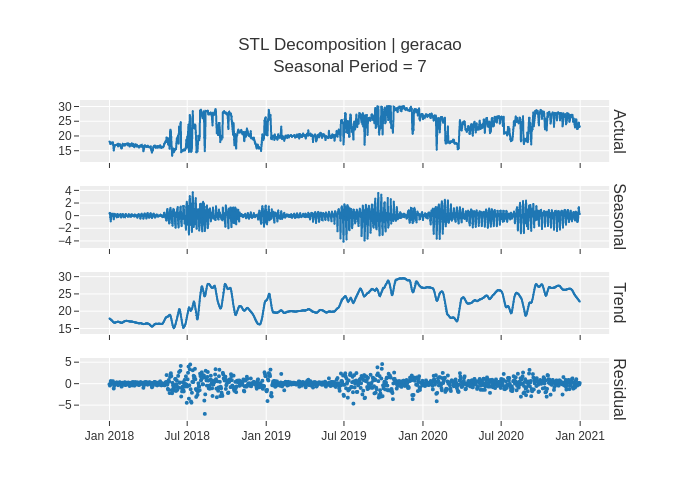

In [41]:
# Decomposição plot
plot_model(plot = 'decomp_stl')

###**✈️ Treinamento e Seleção de Modelos**

In [42]:
models(internal = True)

,Name,Reference,Turbo,Special,Class,Equality,Args,Tune Grid,Tune Distributions,Tune Args,GPU Enabled,Tunable Class
ID,,,,,,,,,,,,
naive,Naive Forecaster,sktime.forecasting.naive.NaiveForecaster,True,False,<class 'sktime.forecasting.naive.NaiveForecast...,<function NaiveContainer.__init__.<locals>.<la...,"{'strategy': 'last', 'sp': 1}","{'strategy': ['last', 'drift'], 'sp': [1]}",{'strategy': CategoricalDistribution(values=['...,{},False,None
grand_means,Grand Means Forecaster,sktime.forecasting.naive.NaiveForecaster,True,False,<class 'sktime.forecasting.naive.NaiveForecast...,<function GrandMeansContainer.__init__.<locals...,"{'strategy': 'mean', 'sp': 1}","{'strategy': ['mean'], 'sp': [1]}",{'strategy': CategoricalDistribution(values=['...,{},False,None
snaive,Seasonal Naive Forecaster,sktime.forecasting.naive.NaiveForecaster,True,False,<class 'sktime.forecasting.naive.NaiveForecast...,<function SeasonalNaiveContainer.__init__.<loc...,{'sp': 7},"{'strategy': ['last', 'mean'], 'sp': [7, 14], ...",{'strategy': CategoricalDistribution(values=['...,{},False,None
polytrend,Polynomial Trend Forecaster,sktime.forecasting.trend.PolynomialTrendForeca...,True,False,<class 'sktime.forecasting.trend.PolynomialTre...,<function ModelContainer.__init__.<locals>.<la...,{},"{'degree': [1, 2, 3, 4, 5], 'with_intercept': ...","{'degree': IntUniformDistribution(lower=1, upp...",{},False,None
arima,ARIMA,sktime.forecasting.arima.ARIMA,True,False,<class 'sktime.forecasting.arima.ARIMA'>,<function ModelContainer.__init__.<locals>.<la...,"{'seasonal_order': (0, 1, 0, 7), 'n_jobs': -1}","{'order': [(0, 1, 0), (1, 0, 1)], 'seasonal_or...","{'order': CategoricalDistribution(values=[(0, ...",{},False,None
auto_arima,Auto ARIMA,sktime.forecasting.arima.AutoARIMA,True,False,<class 'sktime.forecasting.arima.AutoARIMA'>,<function ModelContainer.__init__.<locals>.<la...,"{'sp': 7, 'random_state': 123, 'suppress_warni...","{'max_p': [7], 'max_q': [7], 'max_order': [None]}","{'sp': CategoricalDistribution(values=[7, 14])...",{},False,None
exp_smooth,Exponential Smoothing,sktime.forecasting.exp_smoothing.ExponentialSm...,True,False,<class 'sktime.forecasting.exp_smoothing.Expon...,<function ExponentialSmoothingContainer.__init...,"{'sp': 7, 'seasonal': 'mul', 'trend': 'add'}","{'trend': ['add', 'mul', 'additive', 'multipli...",{'trend': CategoricalDistribution(values=['add...,{},False,None
croston,Croston,sktime.forecasting.croston.Croston,True,False,<class 'sktime.forecasting.croston.Croston'>,<function ModelContainer.__init__.<locals>.<la...,{},"{'smoothing': [0.01, 0.03, 0.1, 0.2, 0.4, 0.6,...","{'smoothing': UniformDistribution(lower=0.01, ...",{},False,None
ets,ETS,sktime.forecasting.ets.AutoETS,True,False,<class 'sktime.forecasting.ets.AutoETS'>,<function ModelContainer.__init__.<locals>.<la...,"{'sp': 7, 'seasonal': 'mul', 'trend': 'add'}","{'error': ['add', 'mul'], 'trend': ['add', 'mu...",{'error': CategoricalDistribution(values=['add...,{},False,None


In [43]:
# from google.colab import data_table
# from vega_datasets import data

# data_table.enable_dataframe_formatter()

In [44]:
# functional API
best = compare_models()

,Model,MAE,RMSE,MAPE,SMAPE,MASE,RMSSE,R2,TT (Sec)
rf_cds_dt,Random Forest w/ Cond. Deseasonalize & Detrending,2.6807,3.342,0.1271,0.1169,1.3149,1.0346,-0.1006,10.60
theta,Theta Forecaster,2.696,3.3313,0.1273,0.1175,1.3224,1.0313,-0.0936,0.18
knn_cds_dt,K Neighbors w/ Cond. Deseasonalize & Detrending,2.7023,3.4169,0.1286,0.1178,1.3255,1.0577,-0.1505,10.36
gbr_cds_dt,Gradient Boosting w/ Cond. Deseasonalize & Det...,2.7143,3.3611,0.1284,0.1183,1.3314,1.0405,-0.1132,0.34
exp_smooth,Exponential Smoothing,2.7202,3.4148,0.1294,0.1184,1.3343,1.0571,-0.1491,1.62
et_cds_dt,Extra Trees w/ Cond. Deseasonalize & Detrending,2.7183,3.3962,0.1291,0.1184,1.3334,1.0513,-0.1366,10.59
ets,ETS,2.7286,3.4481,0.1302,0.1188,1.3384,1.0674,-0.1716,0.24
lightgbm_cds_dt,Light Gradient Boosting w/ Cond. Deseasonalize...,2.7274,3.1832,0.1251,0.1189,1.3378,0.9854,0.0015,0.37
auto_arima,Auto ARIMA,2.7439,3.2265,0.1268,0.1196,1.3459,0.9988,-0.0259,30.27
croston,Croston,2.7499,3.236,0.1272,0.1198,1.3489,1.0018,-0.0319,1.44


In [45]:
print(best)

BaseCdsDtForecaster(regressor=RandomForestRegressor(n_jobs=-1,
                                                    random_state=123),
                    sp=7, window_length=7)


/usr/local/lib/python3.7/dist-packages/pycaret/time_series/forecasting/oop.py:3363: FutureWarning:

this method is deprecated in favour of `Styler.format(precision=..)`



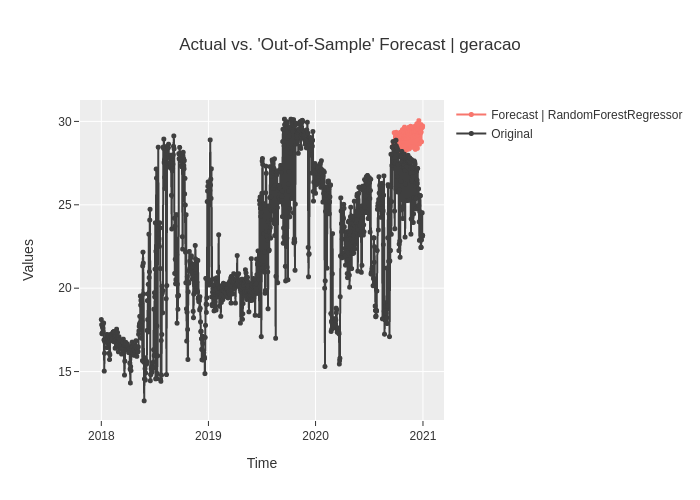

In [46]:
plot_model(best, plot = 'forecast')

###**🚀 Deployment**

## **0. Parametro Best Model PyCaret**

### **1.Best Models Pycaret**

In [47]:
# tune model
tune_model_best = tune_model(best, choose_better = True)

,cutoff,MAE,RMSE,MAPE,SMAPE,MASE,RMSSE,R2
0,2020-06-14,2.7089,3.3709,0.1283,0.118,1.3287,1.0435,-0.1197
Mean,NaT,2.7089,3.3709,0.1283,0.118,1.3287,1.0435,-0.1197
SD,NaT,0.0000,0.0000,0.0000,0.000,0.0000,0.0000,0.0000


In [48]:
# finalize model
final_best = finalize_model(tune_model_best)

In [49]:
# generate predictions
df_best=predict_model(final_best, fh = 365)
df_best

,y_pred
2021-01-01,24.1337
2021-01-02,23.4665
2021-01-03,23.1952
2021-01-04,24.3851
2021-01-05,24.4691
...,...
2021-12-27,26.1814
2021-12-28,26.2790
2021-12-29,26.3667
2021-12-30,26.4680


In [50]:
dfbest=df_best.copy()
dfbest.index=dfbest.index.to_timestamp()
dfbest['geracao']=df_teste['geracao']
dfbest

,y_pred,geracao
2021-01-01,24.1337,22.876548
2021-01-02,23.4665,24.640270
2021-01-03,23.1952,21.461506
2021-01-04,24.3851,23.420420
2021-01-05,24.4691,24.242198
...,...,...
2021-12-27,26.1814,21.742712
2021-12-28,26.2790,17.418880
2021-12-29,26.3667,16.949582
2021-12-30,26.4680,17.836814


In [51]:
dfbest.to_csv(r'/content/pcbest.csv', encoding = 'utf-8', sep =';', header=True, index=True) 

In [52]:
y_true = df_teste['geracao']
y_pred = dfbest['y_pred']
from sklearn.metrics import mean_absolute_percentage_error
MAPE1=mean_absolute_percentage_error(y_true, y_pred)
print ("MAPE BEST = {:0.2f}%". format(MAPE1*100))

MAPE BEST = 9.51%


https://pycaret.gitbook.io/docs/get-started/functions/train#distributed-training-on-a-cluster

In [53]:
# best = compare_models(sort = 'MAE')

In [54]:
# in-sample plot
plot_model(best, plot = 'insample')

In sample predictions has not been implemented for this estimator of type 'BaseCdsDtForecaster' in `sktime`. When this is implemented, it will be enabled by default in pycaret.


In [55]:
best

BaseCdsDtForecaster(regressor=RandomForestRegressor(n_jobs=-1,
                                                    random_state=123),
                    sp=7, window_length=7)

In [56]:
# residuals plot
plot_model(best, plot = 'residuals')

In sample predictions has not been implemented for this estimator of type 'BaseCdsDtForecaster' in `sktime`. When this is implemented, it will be enabled by default in pycaret.
In sample predictions has not been implemented for this estimator of type 'BaseCdsDtForecaster' in `sktime`. When this is implemented, it will be enabled by default in pycaret.


In [57]:
# diagnostics plot
plot_model(best, plot = 'diagnostics')

In sample predictions has not been implemented for this estimator of type 'BaseCdsDtForecaster' in `sktime`. When this is implemented, it will be enabled by default in pycaret.
In sample predictions has not been implemented for this estimator of type 'BaseCdsDtForecaster' in `sktime`. When this is implemented, it will be enabled by default in pycaret.


In [58]:
# y_true = df_teste['geracao']
# y_pred = df_profeta['y_pred']
# from sklearn.metrics import mean_absolute_percentage_error
# MAPE2=mean_absolute_percentage_error(y_true, y_pred)
# print ("MAPE PROPHET = {:0.2f}%". format(MAPE2*100))

## **2. Prophet**

In [59]:
!pip install prophet

In [60]:
# create fbprophet model
prophet = create_model('prophet')
print(prophet)

,cutoff,MAE,RMSE,MAPE,SMAPE,MASE,RMSSE,R2
0,2020-06-14,4.6629,5.8622,0.2239,0.1886,2.2872,1.8147,-2.3864
Mean,NaT,4.6629,5.8622,0.2239,0.1886,2.2872,1.8147,-2.3864
SD,NaT,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000


ProphetPeriodPatched()


In [61]:
tune_prophet = tune_model(prophet, optimize = 'MAPE', choose_better = True) 
print(tune_prophet)

,cutoff,MAE,RMSE,MAPE,SMAPE,MASE,RMSSE,R2
0,2020-06-14,4.0828,5.0918,0.1958,0.169,2.0027,1.5762,-1.5548
Mean,NaT,4.0828,5.0918,0.1958,0.169,2.0027,1.5762,-1.5548
SD,NaT,0.0000,0.0000,0.0000,0.000,0.0000,0.0000,0.0000


ProphetPeriodPatched(changepoint_prior_scale=0.04932984960597856,
                     holidays_prior_scale=0.09385397696776546,
                     seasonality_prior_scale=0.015101973012087256)


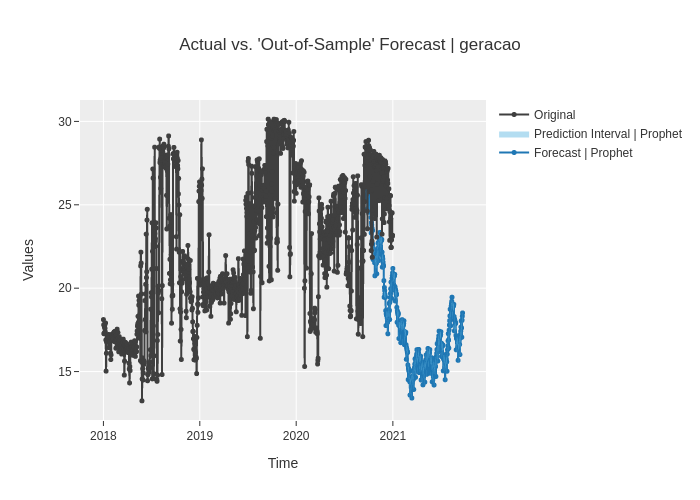

In [62]:
plot_model(prophet, plot = 'forecast', data_kwargs = {'fh' : 365})

In [63]:
# finalize model
final_prophet = finalize_model(prophet)

In [64]:
df_profeta=predict_model(final_prophet,return_pred_int=True, fh = 365)
df_profeta

,y_pred,lower,upper
2021-01-01,24.9336,24.7993,25.1503
2021-01-02,24.3229,24.2642,24.5997
2021-01-03,23.5347,23.4759,23.8059
2021-01-04,24.4548,24.4415,24.7983
2021-01-05,24.5043,24.4307,24.8502
...,...,...,...
2021-12-27,22.2591,22.1027,22.4447
2021-12-28,22.4278,22.2847,22.5495
2021-12-29,22.5583,22.2580,22.5985
2021-12-30,22.7079,22.5888,22.9932


In [65]:
dfprof=df_profeta.copy()
dfprof.index=dfprof.index.to_timestamp()
dfprof['geracao']=df_teste['geracao']
dfprof

,y_pred,lower,upper,geracao
2021-01-01,24.9336,24.7993,25.1503,22.876548
2021-01-02,24.3229,24.2642,24.5997,24.640270
2021-01-03,23.5347,23.4759,23.8059,21.461506
2021-01-04,24.4548,24.4415,24.7983,23.420420
2021-01-05,24.5043,24.4307,24.8502,24.242198
...,...,...,...,...
2021-12-27,22.2591,22.1027,22.4447,21.742712
2021-12-28,22.4278,22.2847,22.5495,17.418880
2021-12-29,22.5583,22.2580,22.5985,16.949582
2021-12-30,22.7079,22.5888,22.9932,17.836814


In [66]:
y_true = dfprof['geracao']
y_pred = dfprof['y_pred']
from sklearn.metrics import mean_absolute_percentage_error
MAPE3=mean_absolute_percentage_error(y_true, y_pred)
print ("MAPE PROPHET = {:0.2f}%". format(MAPE3*100))

MAPE PROPHET = 13.97%


In [67]:
dfprof.to_csv(r'/content/pcprophet.csv', encoding = 'utf-8', sep =';', header=True, index=True) 

## **3.Arima**

In [68]:
# create fbprophet model
arimam = create_model('arima')
print(arimam)

,cutoff,MAE,RMSE,MAPE,SMAPE,MASE,RMSSE,R2
0,2020-06-14,3.2223,4.1492,0.1547,0.1373,1.5806,1.2844,-0.6965
Mean,NaT,3.2223,4.1492,0.1547,0.1373,1.5806,1.2844,-0.6965
SD,NaT,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000


ARIMA(seasonal_order=(0, 1, 0, 7))


In [69]:
tune_arima = tune_model(arimam, optimize = 'MAPE', choose_better = True) 
print(tune_arima)

,cutoff,MAE,RMSE,MAPE,SMAPE,MASE,RMSSE,R2
0,2020-06-14,2.6979,3.1357,0.1231,0.1177,1.3234,0.9707,0.0311
Mean,NaT,2.6979,3.1357,0.1231,0.1177,1.3234,0.9707,0.0311
SD,NaT,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000


ARIMA(order=(1, 0, 1), seasonal_order=(1, 1, 1, 14), with_intercept=False)


In [70]:
# finalize model
final_arima = finalize_model(tune_arima)

In [71]:
# generate predictions
df_arima=predict_model(final_arima, return_pred_int=True, fh = 365)
df_arima

,y_pred,lower,upper
2021-01-01,23.4593,19.7659,27.1526
2021-01-02,22.5048,17.7286,27.2809
2021-01-03,21.5775,16.1130,27.0419
2021-01-04,23.6057,17.6662,29.5451
2021-01-05,23.7622,17.4819,30.0424
...,...,...,...
2021-12-27,24.4961,16.5406,32.4516
2021-12-28,24.4130,16.4572,32.3687
2021-12-29,24.3760,16.4200,32.3319
2021-12-30,24.9146,16.9585,32.8707


In [72]:
dfarima=df_arima.copy()
dfarima.index=dfarima.index.to_timestamp()
dfarima['geracao']=df_teste['geracao']
dfarima

,y_pred,lower,upper,geracao
2021-01-01,23.4593,19.7659,27.1526,22.876548
2021-01-02,22.5048,17.7286,27.2809,24.640270
2021-01-03,21.5775,16.1130,27.0419,21.461506
2021-01-04,23.6057,17.6662,29.5451,23.420420
2021-01-05,23.7622,17.4819,30.0424,24.242198
...,...,...,...,...
2021-12-27,24.4961,16.5406,32.4516,21.742712
2021-12-28,24.4130,16.4572,32.3687,17.418880
2021-12-29,24.3760,16.4200,32.3319,16.949582
2021-12-30,24.9146,16.9585,32.8707,17.836814


In [73]:
dfarima.to_csv(r'/content/pcarima.csv', encoding = 'utf-8', sep =';', header=True, index=True) 

In [74]:
y_true = df_teste['geracao']
y_pred = df_arima['y_pred']
from sklearn.metrics import mean_absolute_percentage_error
MAPE3=mean_absolute_percentage_error(y_true, y_pred)
print ("MAPE ARIMA = {:0.2f}%". format(MAPE3*100))

MAPE ARIMA = 10.57%


In [75]:
import numpy as np

def mean_absolute_percentage_error(y_true, y_pred): 
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [76]:
MAPE33=mean_absolute_percentage_error(y_true, y_pred)


## **4.Blend Models**

https://colab.research.google.com/github/hamzafarooq/pycaret/blob/master/examples/TimeSeries_Forecasting.ipynb#scrollTo=BMYv_OMwUFhN

In [77]:
least_angular= create_model('lar_cds_dt', verbose = False)
bayesian = create_model('br_cds_dt', verbose = False)
huber = create_model('huber_cds_dt',verbose=False)

In [78]:
tuned_best = tune_model(best)
tuned_least_angular= tune_model(least_angular)
tuned_bayesian = tune_model(bayesian)
tuned_huber = tune_model(huber)


,cutoff,MAE,RMSE,MAPE,SMAPE,MASE,RMSSE,R2
0,2020-06-14,2.734,3.4357,0.1301,0.119,1.3411,1.0636,-0.1632
Mean,NaT,2.734,3.4357,0.1301,0.119,1.3411,1.0636,-0.1632
SD,NaT,0.000,0.0000,0.0000,0.000,0.0000,0.0000,0.0000


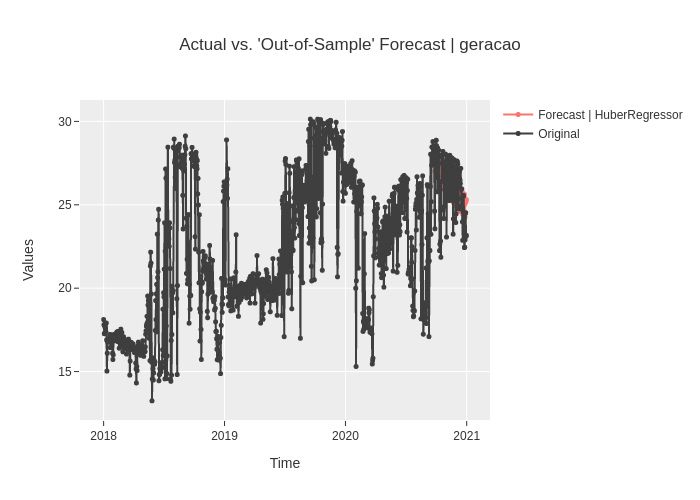

In [79]:
plot_model(tuned_huber)

https://pycaret.gitbook.io/docs/get-started/functions/optimize#blend_models

In [80]:
blend_specific = blend_models(estimator_list = [tuned_best,tuned_least_angular,tuned_bayesian,tuned_huber],  fold = 3, choose_better = True)

,cutoff,MAE,RMSE,MAPE,SMAPE,MASE,RMSSE,R2
0,2019-11-27,3.1850,4.6730,0.1527,0.1284,1.5138,1.4029,-0.7044
1,2020-03-06,1.3239,1.7605,0.0633,0.0616,0.6300,0.5286,0.5562
2,2020-06-14,2.6898,3.2414,0.1255,0.1173,1.3194,1.0034,-0.0354
Mean,NaT,2.3996,3.2250,0.1138,0.1024,1.1544,0.9783,-0.0612
SD,NaT,0.7870,1.1891,0.0374,0.0292,0.3792,0.3574,0.5150


In [81]:
type(blend_specific)

pycaret.internal.ensemble._EnsembleForecasterWithVoting

In [82]:
print(blend_specific)

_EnsembleForecasterWithVoting(forecasters=[('RandomForestRegressor',
                                            BaseCdsDtForecaster(regressor=RandomForestRegressor(n_jobs=-1,
                                                                                                random_state=123),
                                                                sp=7,
                                                                window_length=7)),
                                           ('Lars',
                                            BaseCdsDtForecaster(degree=2,
                                                                regressor=Lars(eps=0.0033412155613488934,
                                                                               normalize=False,
                                                                               random_state=123),
                                                                sp=7)),
                                           ('BayesianRidge

In [83]:
final_blend = finalize_model(blend_specific)

In [84]:
final_blend

_EnsembleForecasterWithVoting(forecasters=[('RandomForestRegressor',
                                            BaseCdsDtForecaster(regressor=RandomForestRegressor(n_jobs=-1,
                                                                                                random_state=123),
                                                                sp=7,
                                                                window_length=7)),
                                           ('Lars',
                                            BaseCdsDtForecaster(degree=2,
                                                                regressor=Lars(eps=0.0033412155613488934,
                                                                               normalize=False,
                                                                               random_state=123),
                                                                sp=7)),
                                           ('BayesianRidge

In [94]:
df_blend=predict_model(blend_specific,return_pred_int=True, fh=365)
df_blend

ValueError: ignored

In [88]:
dfblend=df_blend.copy()
dfblend.index=dfblend.index.to_timestamp()
dfblend['geracao']=df_teste['geracao']
dfblend

,y_pred,lower,upper,geracao
2020-09-23,28.2085,NaN,NaN,NaN
2020-09-24,28.2683,NaN,NaN,NaN
2020-09-25,28.2925,NaN,NaN,NaN
2020-09-26,27.5180,NaN,NaN,NaN
2020-09-27,26.6690,NaN,NaN,NaN
...,...,...,...,...
2020-12-27,24.0454,NaN,NaN,NaN
2020-12-28,24.8529,NaN,NaN,NaN
2020-12-29,24.9169,NaN,NaN,NaN
2020-12-30,24.9984,NaN,NaN,NaN


In [89]:
y_true = df_teste['geracao']
y_pred = dfblend['y_pred']
from sklearn.metrics import mean_absolute_percentage_error
MAPE4=mean_absolute_percentage_error(y_true, y_pred)
print(MAPE4)

ValueError: ignored

In [90]:
MAPE4=mean_absolute_percentage_error(y_true, y_pred)
print ("MAPE BLEND = {:0.2f}%". format(MAPE4*100))

ValueError: ignored

##**5.Visualizando os Resultados**

In [91]:
import plotly.io as pio
pio.renderers.default = "colab"

In [92]:
#Importando os pacotes 
#https://colab.research.google.com/github/amadords/Projetos-Publicos/blob/master/Introdu%C3%A7%C3%A3o_ao_Plotly.ipynb#scrollTo=4NV0oNoMmLfw
#https://colab.research.google.com/github/amadords/Projetos-Publicos/blob/master/Introdu%C3%A7%C3%A3o_ao_Plotly.ipynb#scrollTo=tF4mhRnomRc7
# bibliotecas para trabalhar offline com a biblioteca
import plotly
import plotly.offline as py
import plotly.graph_objs as go # criará de fato os gráficos
from plotly.offline import plot, iplot
import cufflinks as cf # para conectar o plotly ao pandas
cf.go_offline()
plotly.offline.init_notebook_mode(connected = True)


In [ ]:
#Graficos 
import matplotlib.pyplot as plt
import matplotlib as mpl
import plotly.express as px
from matplotlib import pyplot
import seaborn as sns 

In [93]:
#plot_components_plotly(m, forecast)# Create traces
fig = go.Figure()

fig.add_trace(go.Scatter(x=df_treino.index, y=df_treino['geracao'],
                    mode='lines', name='Treino'))
fig.add_trace(go.Scatter(x=df_teste.index, y=df_teste['geracao'],
                    mode='lines', name='Teste'))
fig.add_trace(go.Scatter(x=dfprof.index, y=dfprof['y_pred'],
                    mode='lines',
                    name='Pred. Prophet'))
fig.add_trace(go.Scatter(x=dfbest.index, y=df_best['y_pred'],
                    mode='lines',
                    name='Melhor Modelo Pycaret'))
fig.add_trace(go.Scatter(x=dfblend.index, y=dfblend['y_pred'],
                    mode='lines',
                    name='Blend 2 ao 4 Melhor'))
fig.add_trace(go.Scatter(x=dfarima.index, y=dfarima['y_pred'],
                    mode='lines',
                    name='Arima'))

# Atualizando os eixos x
fig.update_xaxes( title_text = " Tempo ", showgrid=True, gridwidth=1, gridcolor='lightgray',showline=True, linewidth=1, linecolor='black')

# Atualizando os eixos y
fig.update_yaxes( title_text = "Geração de Energia (GWh)", showgrid=True, gridwidth=1,   gridcolor='lightgray',showline=True, linewidth=1, linecolor='black', range=[5,40])

# Adicionando o template
fig.update_layout(template = 'plotly_white') 
#legend
fig.update_layout(legend=dict(orientation="h", font = {'family': 'Arial','size': 10,'color': 'black'},
    yanchor="bottom", y=1, xanchor="right", x=0.9))

# Title 
fig.update_layout(title='Geração Diária de Energia no Amazonas 2018 a 2021', title_x=0.5,title_y=0.93, plot_bgcolor = 'white',
font = {'family': 'Arial','size': 12,'color': 'black'},)

# Menu com seleção de periodo de analise
#fig.update_xaxes(dtick="M1", tickformat="%b\n%Y")
fig.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list([
            dict(count=1, label="1m", step="month", stepmode="backward"),
            dict(count=6, label="6m", step="month", stepmode="backward"),
            dict(count=1, label="YTD", step="year", stepmode="todate"),
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(step="all")
        ])
    )
)

fig.update_layout(autosize=True,width=1200, height=900)
#fig.write_image("grafico.png") 
#fig.write_html("grafico.html")
fig.show()

In [ ]:
# save the model
save_model(final_best, 'my_best_model')

https://towardsdatascience.com/announcing-pycarets-new-time-series-module-b6e724d4636c


https://pycaret.gitbook.io/docs/learn-pycaret/official-blog/multiple-time-series-forecasting-with-pycaret

https://pycaret.gitbook.io/docs/learn-pycaret/official-blog/multiple-time-series-forecasting-with-pycaret#multiple-time-series-forecasting-with-pycaret

https://analyticsindiamag.com/a-beginners-guide-to-time-series-modelling-using-pycaret/